In [1]:
from moviepy.editor import VideoFileClip
from pathlib import Path
import os
import numpy as np
import pandas as pd
import random

import tensorflow.compat.v1 as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import keras_cv
import keras
import cv2

from sklearn.preprocessing import LabelEncoder
from sklearn import ensemble
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import matplotlib.pyplot as plt
import seaborn as sns

import shutil
from tqdm import tqdm

import warnings
warnings.filterwarnings("ignore", category=UserWarning) #used to supress the tf version warning. 

mids_dir = Path("D:\\MIDS-W207")
data = mids_dir/"MIDS-W207-Spring24-Soccer-Detection-Data"
project = mids_dir/"MIDS-W207-Spring24-Soccer-Detection"
analysis = project/"analysis"

# Author: Timothy Majidzadeh
# Date Created: March 4, 2024
# Date Updated: March 5, 2024
# Description: Develop the baseline model.
# Notes: [v1] Created program.
# Inputs: Frame-by-frame image data & labels.
# Outputs: Object detection model?


Using TensorFlow backend


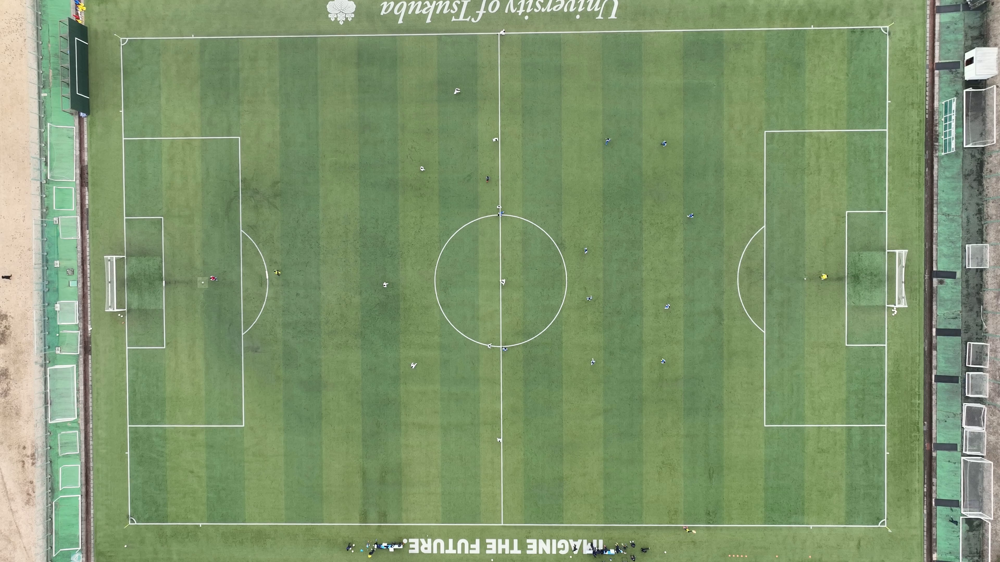

In [2]:
first_img = load_img(data/"base/top_view/D_20220220_1_0000_0030/D_20220220_1_0000_0030_1.png")
first_img

In [3]:
labels = pd.read_pickle(data/"base/top_view_labels/top_view_labels.pkl")

In [4]:
target_width, target_height = 1280, 736
train_pct, val_pct = 0.6, 0.4
batch_size = 8
learning_rate = 0.001
epoch = 5
global_clipnorm = 10
class_ids = [
    "ball"
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

In [5]:
def scale_labels(input_df, target_height, target_width):
    resized_labels = input_df.copy()
    resized_labels.loc[
        : , (slice(None), slice(None), ['bb_width', 'bb_left']
    )] = round(resized_labels.loc[: , (slice(None), slice(None), ['bb_width', 'bb_left'])] * target_width / 3840)
    resized_labels.loc[
        : , (slice(None), slice(None), ['bb_height', 'bb_top'])
    ] = round(resized_labels.loc[: , (slice(None), slice(None), ['bb_height', 'bb_top'])] * target_height / 2160)
    return resized_labels

In [6]:
# resized_labels = scale_labels(labels, target_height=target_height, target_width=target_width)
resized_labels = labels.copy()
resized_filtered_labels = resized_labels[(resized_labels['frame_saved'] == True)]
sampled_labels = resized_filtered_labels.sample(frac = 0.1, random_state=507401).reset_index()
sampled_labels

index                 vidname frame                   frame_imgname  \
                                                                           
                                                                           
0      704  D_20220220_1_0420_0450   705  D_20220220_1_0420_0450_705.png   
1      522  D_20220220_1_0120_0150   523  D_20220220_1_0120_0150_523.png   
2       11  D_20220220_1_0510_0540    12   D_20220220_1_0510_0540_12.png   
3      668  D_20220220_1_0660_0690   669  D_20220220_1_0660_0690_669.png   
4      549  D_20220220_1_0990_1020   550  D_20220220_1_0990_1020_550.png   
...    ...                     ...   ...                             ...   
5317   107  D_20220220_1_0420_0450   108  D_20220220_1_0420_0450_108.png   
5318   296  D_20220220_1_1200_1230   297  D_20220220_1_1200_1230_297.png   
5319   681  D_20220220_1_1410_1440   682  D_20220220_1_1410_1440_682.png   
5320   325  D_20220220_1_0300_0330   326  D_20220220_1_0300_0330_326.png   
5321   249  D_20220220_1_0270_0300   250  D_20220220_1_0270_0300_250.png   

                                          frame_imgpath    team_0  \
                                                        player_00   
                                                        bb_height   
0     D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      39.0   
1     D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      39.0   
2     D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      30.0   
3     D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      26.0   
4     D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      30.0   
...                                                 ...       ...   
5317  D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      39.0   
5318  D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      20.0   
5319  D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      32.0   
5320  D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      39.0   
5321  D:\MIDS-W207\MIDS-W207-Spring24-Soccer-Detecti...      39.0   

                                              ...    team_1                    \
                                   player_01  ... player_08 player_09           
          bb_left  bb_top bb_width bb_height  ...  bb_width bb_height bb_left   
0     1062.923077  1188.0     39.0      39.0  ...      39.0      39.0  2496.0   
1     1276.000000   956.0     39.0      39.0  ...      39.0      39.0  2671.0   
2      867.000000  1098.0     40.0      38.0  ...      32.0      27.0  2341.0   
3      640.000000   826.0     32.0      30.0  ...      28.0      22.0  2227.0   
4      665.000000  1189.0     36.0      40.0  ...      33.0      25.0  1967.0   
...           ...     ...      ...       ...  ...       ...       ...     ...   
5317   980.000000  1060.0     39.0      39.0  ...      39.0      39.0  2946.0   
5318   718.000000  1062.0     37.0      28.0  ...      29.0      26.0  2470.0   
5319  1114.000000  1107.0     36.0      40.0  ...      32.0      46.0  2621.0   
5320   594.166667   873.0     39.0      39.0  ...      39.0      39.0  1871.0   
5321   565.000000  1464.0     39.0      39.0  ...      39.0      39.0  1864.0   

                                  ball                                     \
                                  ball                                      
           bb_top   bb_width bb_height      bb_left       bb_top bb_width   
0     1673.000000  39.000000      15.0  2382.666667  1652.333333     17.0   
1     1023.000000  39.000000      12.0  2334.000000  1174.000000     11.0   
2     1500.000000  38.000000      16.0  2416.000000  1042.000000     16.0   
3      897.000000  33.000000      14.0  2234.000000   231.000000     14.0   
4     1334.000000  26.000000      20.0  1139.636364  1662.454545     20.0   
...           ...        ...       ...          ...          ...      ...   
5317   908.000000  39.000000      15.0  3008.600000   355.800000     17.0   
5318  1136.000000  28.782609      12.0  2033.666667  1095.833333    

In [7]:
def get_bbs(input_df):
    classes = tf.constant([[0] for i in input_df.index])
    boxes = tf.constant([
        [
            [
                input_df['ball']['ball']['bb_left'][i], input_df['ball']['ball']['bb_top'][i],
                input_df['ball']['ball']['bb_width'][i], input_df['ball']['ball']['bb_height'][i]
            ]
        ]
    for i in input_df.index])
    return classes, boxes

In [8]:
classes, boxes = get_bbs(sampled_labels)
paths = sampled_labels["frame_imgpath"]
# images = [img_to_array(load_img(path, target_size=(target_height, target_width))) for path in paths]
tf_data = tf.data.Dataset.from_tensor_slices((
    tf.constant(paths),
    classes,
    boxes
))
tf_data

<_TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(1,), dtype=tf.int32, name=None), TensorSpec(shape=(1, 4), dtype=tf.float64, name=None))>

In [9]:
print(classes)
print(boxes)

tf.Tensor(
[[0]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]], shape=(5322, 1), dtype=int32)
tf.Tensor(
[[[2382.66666667 1652.33333333   17.           15.        ]]

 [[2334.         1174.           11.           12.        ]]

 [[2416.         1042.           16.           16.        ]]

 ...

 [[2273.63636364 1645.36363636   18.           16.        ]]

 [[ 628.          889.           17.           17.        ]]

 [[ 602.15384615 1471.07692308   18.           18.        ]]], shape=(5322, 1, 4), dtype=float64)


In [10]:
# Split the list of sampled images into train, val & test.
train_index = int(round(sampled_labels.shape[0] * train_pct))
train = tf_data.take(train_index)
val = tf_data.skip(train_index)

In [11]:
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    return image

def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox
    }
    print(bounding_boxes)
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}

In [12]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.Resizing(
            height=target_height,
            width=target_width,
            interpolation="bilinear",
            crop_to_aspect_ratio=False,
            pad_to_aspect_ratio=True,
            bounding_box_format="xywh"
        ),
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh")
    ]
)

In [13]:
resizing = keras_cv.layers.Resizing(
    height=target_height,
    width=target_width,
    interpolation="bilinear",
    crop_to_aspect_ratio=False,
    pad_to_aspect_ratio=True,
    bounding_box_format="xywh"
)

In [14]:
train, val = train.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE), val.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)

train, val = train.shuffle(batch_size * 4), val.shuffle(batch_size * 4)
print(train)
train, val = train.ragged_batch(batch_size, drop_remainder=True), val.ragged_batch(batch_size, drop_remainder=True)
print(train)
train = train.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)
val = val.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)

{'classes': <tf.Tensor 'Cast:0' shape=(1,) dtype=float32>, 'boxes': <tf.Tensor 'args_2:0' shape=(1, 4) dtype=float64>}
{'classes': <tf.Tensor 'Cast:0' shape=(1,) dtype=float32>, 'boxes': <tf.Tensor 'args_2:0' shape=(1, 4) dtype=float64>}
<_ShuffleDataset element_spec={'images': TensorSpec(shape=(None, None, 3), dtype=tf.float32, name=None), 'bounding_boxes': {'classes': TensorSpec(shape=(1,), dtype=tf.float32, name=None), 'boxes': TensorSpec(shape=(1, 4), dtype=tf.float64, name=None)}}>
<_BatchDataset element_spec={'images': RaggedTensorSpec(TensorShape([8, None, None, 3]), tf.float32, 2, tf.int64), 'bounding_boxes': {'classes': TensorSpec(shape=(8, 1), dtype=tf.float32, name=None), 'boxes': TensorSpec(shape=(8, 1, 4), dtype=tf.float64, name=None)}}>


In [15]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]

# Check to see if this still works when you're still using tuples
train, val = train.map(dict_to_tuple), val.map(dict_to_tuple)
train, val = train.prefetch(tf.data.AUTOTUNE), val.prefetch(tf.data.AUTOTUNE)

In [16]:
# Make the model!
optimizer = keras.optimizers.Adam(
    learning_rate=learning_rate, global_clipnorm=global_clipnorm
)
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_s_backbone"
)
model = keras_cv.models.YOLOV8Detector(
    backbone=backbone,
    num_classes=len(class_mapping),
    bounding_box_format="xywh",
    fpn_depth=1
)

In [ ]:
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    val, bounding_box_format="xywh"
)
model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer
)
model.fit(
    train,
    validation_data=val,
    epochs=epoch
)

Epoch 1/5


     30/Unknown - 273s 8s/step - loss: 27189.1504 - box_loss: 1.2978e-08 - class_loss: 27189.1504

In [ ]:
model.save_weights(project/"analysis/Yolov8/YOLOv8_Baseline_v2")

In [ ]:
model.evaluate(val)